In [1]:
import gc
import os
import re
import torch
import numpy as np
import matplotlib.pyplot as plt
import random
from PIL import Image
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset, Subset
from torch.optim import AdamW
from torchvision import transforms
from google.colab import drive
from transformers import ZoeDepthForDepthEstimation

# Clear up memory after the run
gc.collect()
torch.cuda.empty_cache()

# Überprüfen, ob eine GPU verfügbar ist
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Mount Google Drive
drive.mount('/content/drive')


Using device: cuda
Mounted at /content/drive


In [2]:
# Pfade zu den Datensätzen
pointclouds_dir = '/content/drive/MyDrive/Pointclouds1'
orthophotos_dir = '/content/drive/MyDrive/Orthophotos1'

# Muster zum Abgleichen von Dateinamen
pattern = r"(\d+\.\d+)_(\d+\.\d+)_part_(\d+)_(\d+)"

def extract_numbers(filename):
    """Extrahiere die Zahlen basierend auf dem Muster."""
    match = re.search(pattern, filename)
    if match:
        return float(match.group(1)), float(match.group(2)), int(match.group(3)), int(match.group(4))
    return None

def load_data():
    image_paths, depth_paths = [], []
    pointcloud_files = sorted(os.listdir(pointclouds_dir))
    orthophoto_files = sorted(os.listdir(orthophotos_dir))

    for ortho_file in orthophoto_files:
        if ortho_file.endswith('.jpg'):
            ortho_match = extract_numbers(ortho_file)

            if ortho_match is None:
                continue

            for pc_file in pointcloud_files:
                pc_match = extract_numbers(pc_file)

                if pc_match is None:
                    continue

                if ortho_match == pc_match:
                    image_path = os.path.join(orthophotos_dir, ortho_file)
                    depth_path = os.path.join(pointclouds_dir, pc_file)

                    image_paths.append(image_path)
                    depth_paths.append(depth_path)
                    break

    return image_paths, depth_paths


In [3]:
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import numpy as np

# Größe für das Resizing
resize_size = (256, 256)  # Beispiel für eine reduzierte Größe (256x256)

# Dataset-Klasse für Bilder und Tiefenkarten
class ImageDepthDataset(Dataset):
    def __init__(self, image_paths, depth_paths):
        self.image_paths = image_paths
        self.depth_paths = depth_paths

        # Transformationen definieren
        self.common_transform = transforms.Compose([
            transforms.Resize(resize_size),  # Verkleinere die Bilder und Tiefenkarten
            transforms.ToTensor(),
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Bild und Tiefenkarte laden und transformieren
        image = Image.open(self.image_paths[idx]).convert('RGB')
        image = self.common_transform(image)

        # Tiefenkarte laden
        depth = np.load(self.depth_paths[idx])
        depth = np.where(depth < 0, 0, depth)  # Negative Werte auf 0 setzen
        depth = torch.tensor(depth).unsqueeze(0)  # Kanal-Dimension hinzufügen

        # Tiefenkarte auf die gleiche Größe wie das Bild anpassen
        depth = transforms.functional.resize(depth, resize_size)  # Hier anpassen

        return image, depth


In [4]:
# Debugging-Funktion zur Visualisierung von Beispielen
def debug_visualize_samples(dataset, num_samples=5):
    indices = random.sample(range(len(dataset)), num_samples)
    for idx in indices:
        image, depth = dataset[idx]
        image = image.permute(1, 2, 0).numpy()  # In HWC-Format konvertieren
        depth = depth.squeeze().numpy()  # Kanal-Dimension entfernen

        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.title(f"Image - Index {idx}")

        plt.subplot(1, 2, 2)
        plt.imshow(depth, cmap='plasma')
        plt.title(f"Depth Map - Index {idx}")

        plt.show()


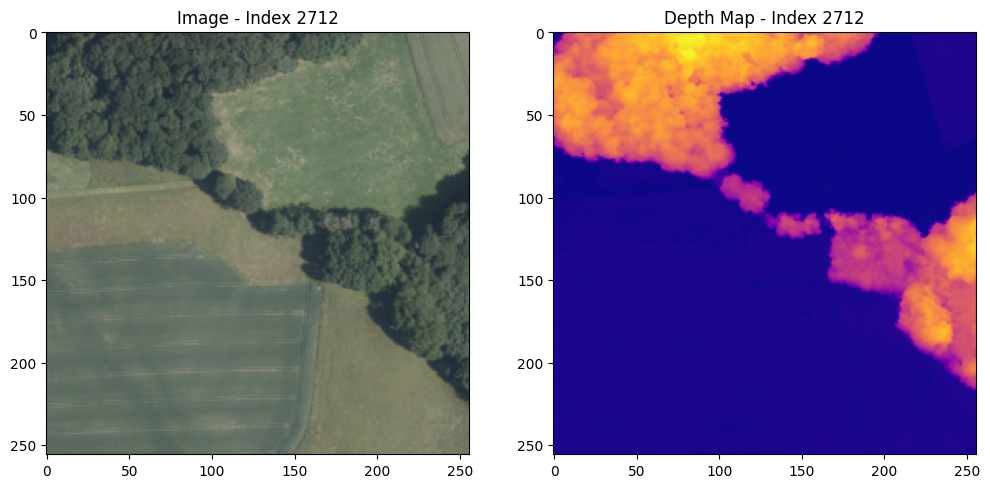

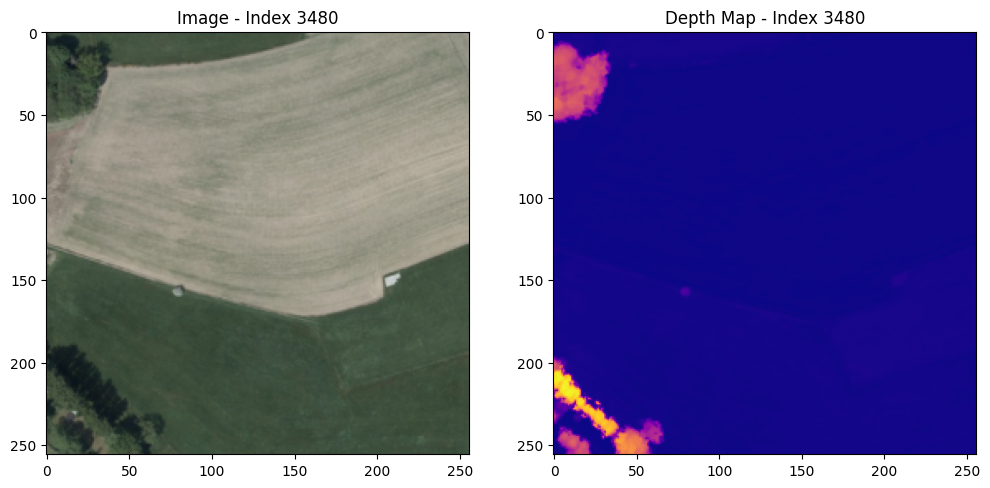

In [5]:
# Lade die Pfade zu Bildern und Tiefen
image_paths, depth_paths = load_data()

# Erstelle das Dataset
dataset = ImageDepthDataset(image_paths, depth_paths)

# Splitte das Dataset in Trainings- und Testdaten
indices = list(range(len(dataset)))
train_indices, test_indices = train_test_split(indices, test_size=0.2, random_state=42)

# Erstelle Subset-Datasets
train_dataset = Subset(dataset, train_indices)
test_dataset = Subset(dataset, test_indices)

# Visualisiere einige Beispiele
debug_visualize_samples(train_dataset, num_samples=2)


# Modell

In [6]:
batch_size = 40

# Erstelle DataLoader für Training und Test
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

print(f"Loaded and saved {len(train_loader)} training batches and {len(test_loader)} test batches.")


Loaded and saved 172 training batches and 43 test batches.


In [7]:
# Lade das vortrainierte ZoeDepth-Modell
model = ZoeDepthForDepthEstimation.from_pretrained("Intel/zoedepth-nyu-kitti")

# Überprüfe, ob eine GPU verfügbar ist
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Modell auf das entsprechende Gerät verschieben

# AdamW-Optimierer definieren
optimizer = AdamW(model.parameters(), lr=1e-5)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/2.23k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.38G [00:00<?, ?B/s]

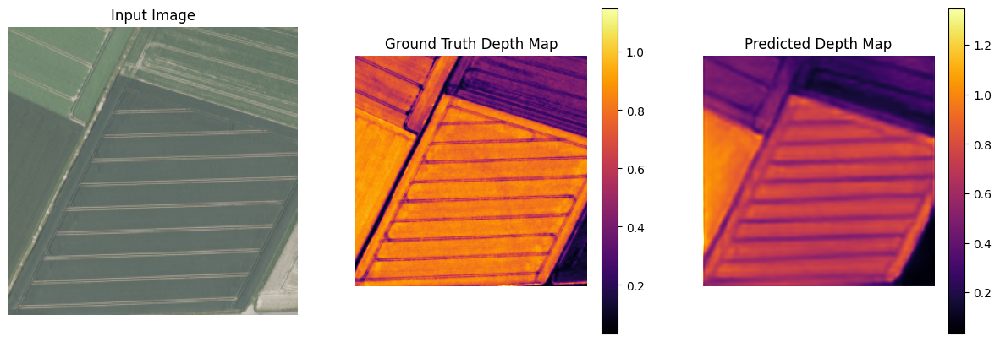

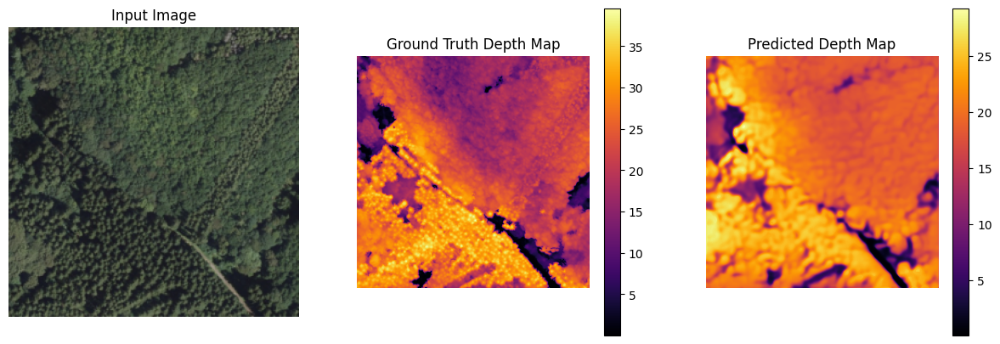

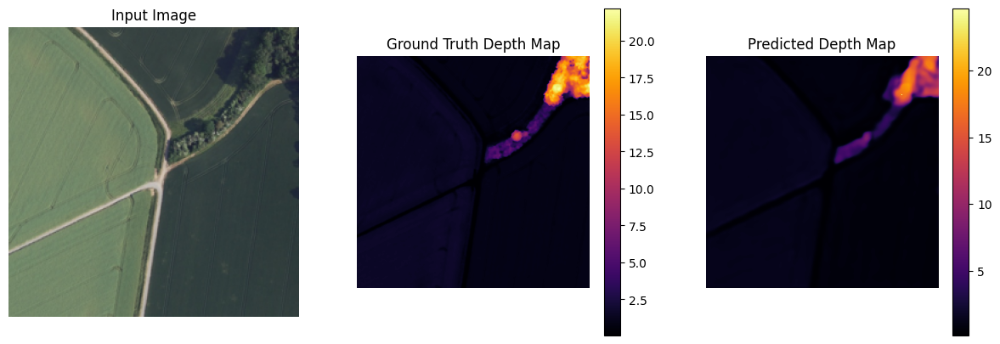

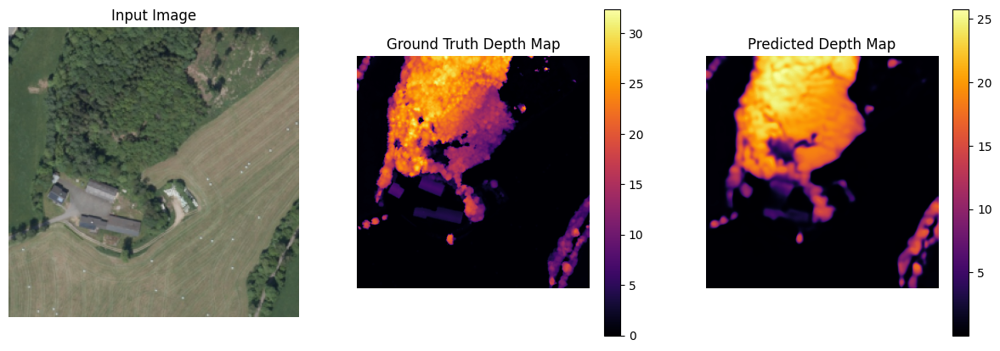

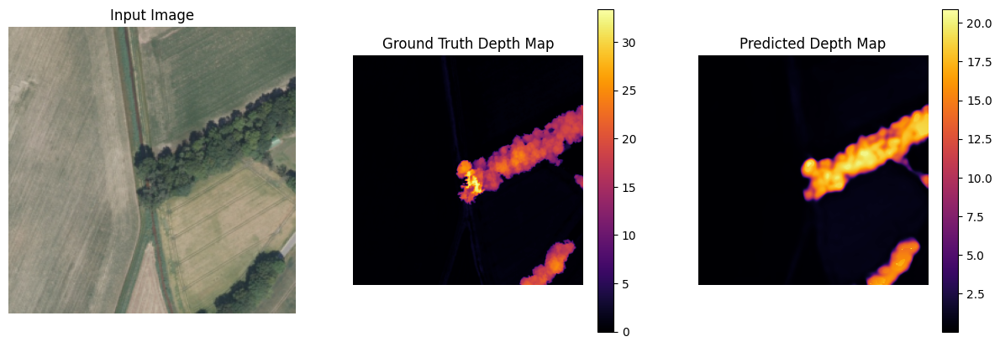

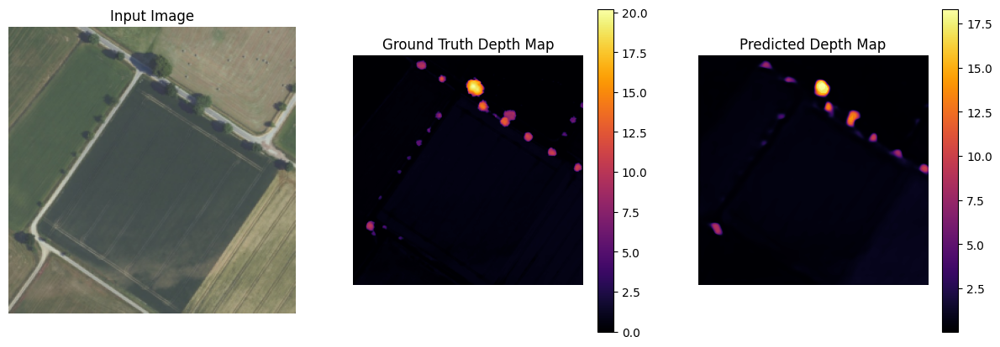

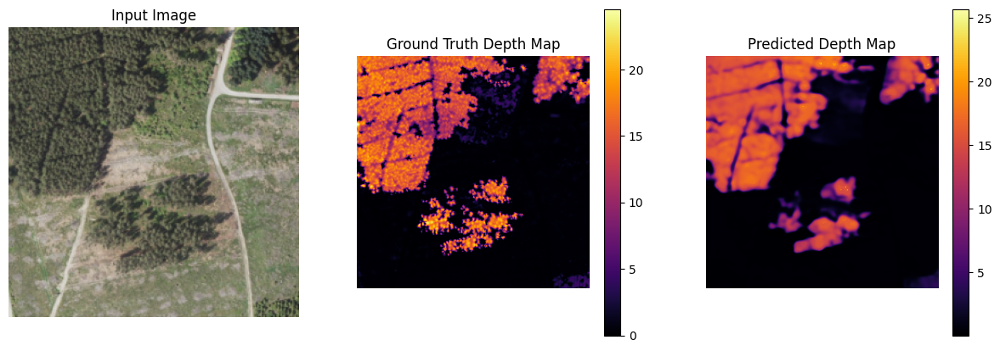

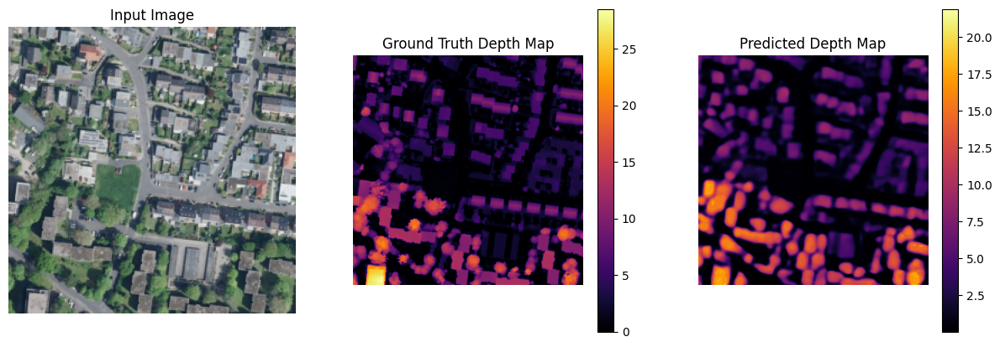

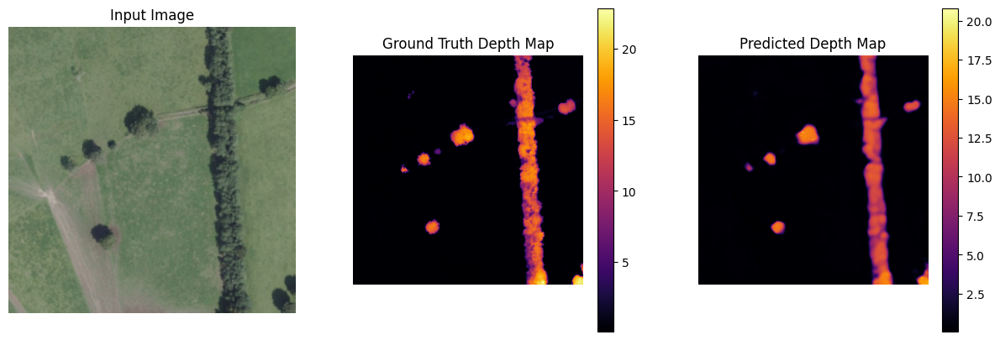

KeyboardInterrupt: 

In [ ]:
import torch
import matplotlib.pyplot as plt
import gc
from torch.nn import HuberLoss

# Initialize lists to store test losses and predictions
test_losses = []
predictions = []

# Define Huber loss function
huber_loss_fn = HuberLoss(reduction='mean', delta=1.0)  # Adjust delta as necessary

# Move the model to CPU for evaluation
model.to('cpu')
model.eval()

# Define evaluation function with visualization
def evaluate_and_visualize(model, test_loader, num_samples=3):
    total_loss = 0
    with torch.no_grad():
        for batch_idx, (images, depths) in enumerate(test_loader):
            # Move images and depths to CPU
            images = images.to('cpu')
            depths = depths.to('cpu')

            # Predict depths from model
            outputs = model(images).predicted_depth
            predicted_depths = outputs.unsqueeze(1)  # Add a channel dimension if necessary

            # Compute the Huber loss
            loss = huber_loss_fn(predicted_depths, depths)
            total_loss += loss.item()

            # Visualize predictions for a few samples
            if batch_idx < num_samples:
                for i in range(min(len(images), num_samples)):
                    # Plot predicted depth map
                    plt.figure(figsize=(15, 5))

                    # Plot input image
                    plt.subplot(1, 3, 1)
                    plt.imshow(images[i].permute(1, 2, 0).numpy())
                    plt.title('Input Image')
                    plt.axis('off')

                    # Plot ground truth depth map
                    plt.subplot(1, 3, 2)
                    plt.imshow(depths[i].squeeze(), cmap='inferno')
                    plt.colorbar()
                    plt.title('Ground Truth Depth Map')
                    plt.axis('off')

                    # Plot predicted depth map
                    plt.subplot(1, 3, 3)
                    plt.imshow(predicted_depths[i].squeeze(), cmap='inferno')
                    plt.colorbar()
                    plt.title('Predicted Depth Map')
                    plt.axis('off')

                    plt.show()

            # Save the predictions
            predictions.append(predicted_depths.cpu().numpy())

    # Calculate the average loss for the test set
    average_loss = total_loss / len(test_loader)
    test_losses.append(average_loss)
    print(f"Test Loss: {average_loss}")

# Call the evaluation function with visualization
evaluate_and_visualize(model, test_loader)

# Plot the test loss over batches
plt.figure(figsize=(10, 5))
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Batches')
plt.ylabel('Loss')
plt.title('Test Loss Over Batches')
plt.legend()
plt.show()

# Clear up memory after the run
gc.collect()
torch.cuda.empty_cache()

# Check predictions
print(f"Number of predictions: {len(predictions)}")


Epoch 1/12: 100%|██████████| 343/343 [1:06:32<00:00, 11.64s/it]


Epoch [1/12], Training Loss: 3.8530


Epoch 2/12: 100%|██████████| 343/343 [06:41<00:00,  1.17s/it]


Epoch [2/12], Training Loss: 2.1442


Epoch 3/12: 100%|██████████| 343/343 [06:42<00:00,  1.17s/it]


Epoch [3/12], Training Loss: 1.7912


Epoch 4/12: 100%|██████████| 343/343 [06:35<00:00,  1.15s/it]


Epoch [4/12], Training Loss: 1.6325


Epoch 5/12: 100%|██████████| 343/343 [06:33<00:00,  1.15s/it]


Epoch [5/12], Training Loss: 1.5296


Epoch 6/12: 100%|██████████| 343/343 [06:38<00:00,  1.16s/it]


Epoch [6/12], Training Loss: 1.4558


Epoch 7/12: 100%|██████████| 343/343 [06:43<00:00,  1.18s/it]


Epoch [7/12], Training Loss: 1.4143


Epoch 8/12: 100%|██████████| 343/343 [06:38<00:00,  1.16s/it]


Epoch [8/12], Training Loss: 1.3616


Epoch 9/12: 100%|██████████| 343/343 [06:33<00:00,  1.15s/it]


Epoch [9/12], Training Loss: 1.3218


Epoch 10/12: 100%|██████████| 343/343 [06:34<00:00,  1.15s/it]


Epoch [10/12], Training Loss: 1.2876


Epoch 11/12: 100%|██████████| 343/343 [06:40<00:00,  1.17s/it]


Epoch [11/12], Training Loss: 1.2352


Epoch 12/12: 100%|██████████| 343/343 [06:35<00:00,  1.15s/it]

Epoch [12/12], Training Loss: 1.2253


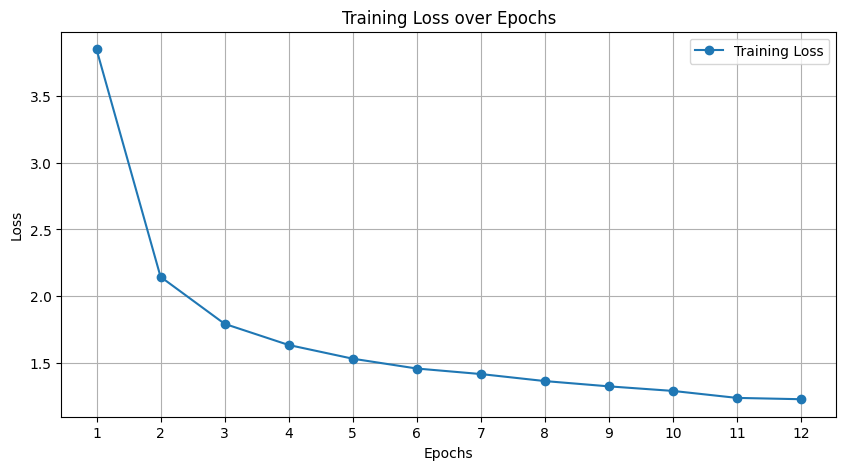

Average Test Loss: 1.4011


In [8]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from tqdm import tqdm  # Für den Fortschrittsbalken
from torchvision import transforms
from torch.utils.data import DataLoader
import random  # Für zufällige Auswahl im Dataset

# Hyperparameter
num_epochs = 12
batch_size = 20
learning_rate = 1e-5

# Device-Konfiguration (CPU oder GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Datenvorverarbeitung mit höherer Auflösung
transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
])

# Beispiel für den DataLoader (train_dataset und test_dataset sollten bereits definiert sein)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Definiere das Modell (angenommen, das Modell ist bereits definiert und auf dem Gerät)
model.to(device)
model.train()

# Optimizer und Scheduler definieren
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

# Listen zum Speichern der Verlustwerte
train_losses = []

# Training
for epoch in range(num_epochs):
    total_train_loss = 0

    # Durchlaufe den DataLoader für das Training
    for images, depths in tqdm(train_loader, desc=f'Epoch {epoch + 1}/{num_epochs}'):
        optimizer.zero_grad()

        images = images.to(device)
        depths = depths.to(device)

        # Vorhersagen des Modells
        outputs = model(images).predicted_depth

        if outputs.dim() == 3:
            outputs = outputs.unsqueeze(1)

        depths = depths.squeeze(2)

        # MAE-Loss berechnen
        loss = F.l1_loss(outputs, depths.float())

        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    # Durchschnittlicher Verlust für die Epoche
    avg_train_loss = total_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)
    print(f"Epoch [{epoch + 1}/{num_epochs}], Training Loss: {avg_train_loss:.4f}")

    scheduler.step()

# Plot der Trainingsverluste
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), train_losses, marker='o', label='Training Loss')
plt.title('Training Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.xticks(range(1, num_epochs + 1))
plt.legend()
plt.grid()
plt.show()

# Berechnung des Testverlusts
model.eval()
total_test_loss = 0
with torch.no_grad():
    for images, depths in test_loader:
        images = images.to(device)
        depths = depths.to(device)

        outputs = model(images).predicted_depth

        if outputs.dim() == 3:
            outputs = outputs.unsqueeze(1)

        depths = depths.squeeze(2)

        loss = F.l1_loss(outputs, depths.float())
        total_test_loss += loss.item()

avg_test_loss = total_test_loss / len(test_loader)
print(f"Average Test Loss: {avg_test_loss:.4f}")


In [20]:
from google.colab import drive
import torch

# Google Drive mounten
drive.mount('/content/drive')

# Sicherstellen, dass das Modell auf das gewünschte Gerät verschoben wurde
model.to(device)

# Pfad zum Speichern des Modells in Google Drive im 'checkpoints'-Ordner
model_save_path = '/content/drive/MyDrive/checkpoints/mein_gg_model.pth'

# Speichere das gesamte Modell
torch.save(model, model_save_path)

print(f"Modell erfolgreich gespeichert unter: {model_save_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Modell erfolgreich gespeichert unter: /content/drive/MyDrive/checkpoints/mein_gg_model.pth


# Nur Parameter

In [23]:
from google.colab import drive
import torch

# Google Drive mounten
drive.mount('/content/drive')

# Sicherstellen, dass das Modell auf das gewünschte Gerät verschoben wurde
model.to(device)

# Pfad zum Speichern der Modellparameter in Google Drive im 'checkpoints'-Ordner
param_save_path = '/content/drive/MyDrive/checkpoints/mein_gg_model_params.pth'

# Speichere nur die Modellparameter
torch.save(model.state_dict(), param_save_path)

print(f"Modellparameter erfolgreich gespeichert unter: {param_save_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Modellparameter erfolgreich gespeichert unter: /content/drive/MyDrive/checkpoints/mein_gg_model_params.pth


# Das ganze Model (gespeichert)

In [10]:
from google.colab import drive
drive.mount('/content/drive')
# Stelle sicher, dass das Modell auf das Gerät verschoben wurde
model.to(device)

# Pfad zum Speichern des Modells in Google Drive
model_save_path = '/content/drive/MyDrive/mein_ganzes_modell.pth'

# Speichere das gesamte Modell
torch.save(model, model_save_path)

print(f"Modell erfolgreich gespeichert unter: {model_save_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Modell erfolgreich gespeichert unter: /content/drive/MyDrive/mein_ganzes_modell.pth


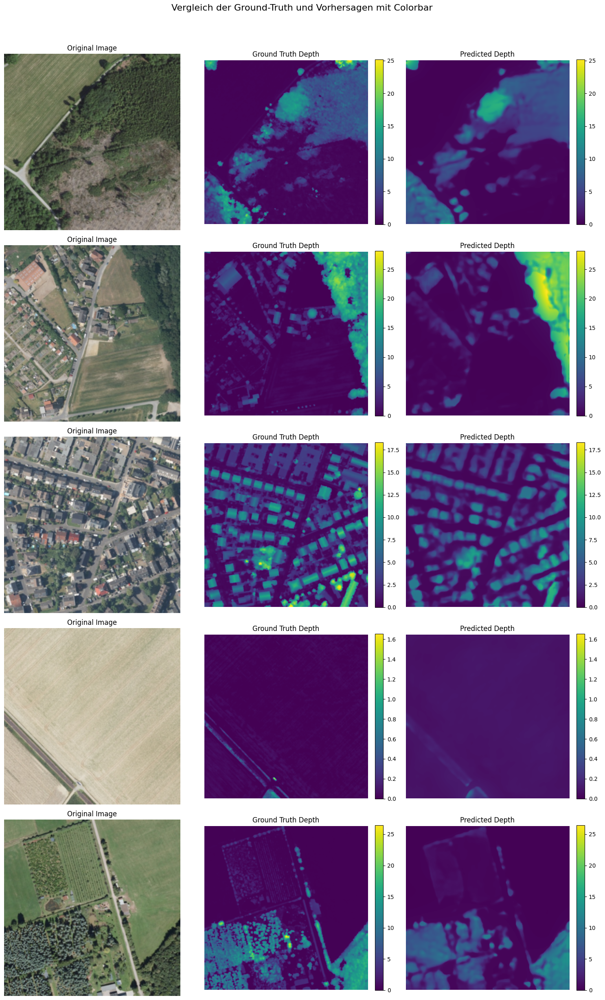

In [26]:
import torch
import matplotlib.pyplot as plt
import numpy as np

# Setze das Modell in den Evaluationsmodus
model.eval()

# Beispielhafte Anzahl von Vergleichsbildern, die wir visualisieren möchten
num_images_to_display = 5

# Wähle zufällige Bilder aus dem Testset
random_indices = random.sample(range(len(test_dataset)), num_images_to_display)

# Erstelle die Plots
fig, axes = plt.subplots(num_images_to_display, 3, figsize=(15, num_images_to_display * 5))
fig.suptitle('Vergleich der Ground-Truth und Vorhersagen mit Colorbar', fontsize=16)

# Loop über zufällig ausgewählte Bilder
for i, idx in enumerate(random_indices):
    # Lade Bild und Ground-Truth
    image, ground_truth_depth = test_dataset[idx]
    image = image.to(device).unsqueeze(0)  # Hinzufügen der Batch-Dimension

    # Modellvorhersage
    with torch.no_grad():
        predicted_depth = model(image).predicted_depth
    predicted_depth = predicted_depth.squeeze().cpu().numpy()

    # Ground-Truth umformen und auf die CPU holen
    ground_truth_depth = ground_truth_depth.squeeze().cpu().numpy()

    # Bestimme den gemeinsamen Wertebereich für die Colorbar
    vmin = min(predicted_depth.min(), ground_truth_depth.min())
    vmax = max(predicted_depth.max(), ground_truth_depth.max())

    # Originalbild
    axes[i, 0].imshow(image.squeeze().cpu().permute(1, 2, 0))
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis('off')

    # Ground-Truth-Tiefenbild mit Colorbar
    im1 = axes[i, 1].imshow(ground_truth_depth, cmap='viridis', vmin=vmin, vmax=vmax)
    axes[i, 1].set_title("Ground Truth Depth")
    axes[i, 1].axis('off')
    fig.colorbar(im1, ax=axes[i, 1], fraction=0.046, pad=0.04)

    # Vorhergesagtes Tiefenbild mit Colorbar
    im2 = axes[i, 2].imshow(predicted_depth, cmap='viridis', vmin=vmin, vmax=vmax)
    axes[i, 2].set_title("Predicted Depth")
    axes[i, 2].axis('off')
    fig.colorbar(im2, ax=axes[i, 2], fraction=0.046, pad=0.04)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


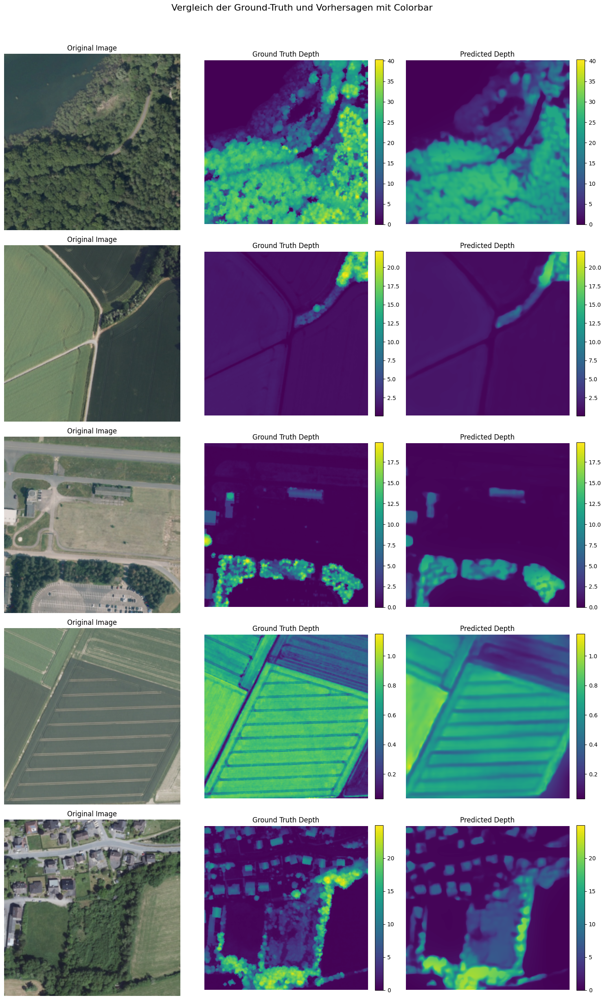

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import random
import gc
from torch.nn import HuberLoss

# Initialize lists to store test losses and predictions
test_losses = []
predictions = []

# Define Huber loss function
huber_loss_fn = HuberLoss(reduction='mean', delta=1.0)  # Adjust delta as necessary

# Move the model to CPU for evaluation
model.to('cpu')
model.eval()

# Define evaluation function with visualization
def evaluate_and_visualize(model, test_loader, num_samples=5):
    total_loss = 0
    with torch.no_grad():
        for batch_idx, (images, depths) in enumerate(test_loader):
            # Move images and depths to CPU
            images = images.to('cpu')
            depths = depths.to('cpu')

            # Predict depths from model
            outputs = model(images).predicted_depth
            predicted_depths = outputs.unsqueeze(1)  # Add a channel dimension if necessary

            # Compute the Huber loss
            loss = huber_loss_fn(predicted_depths, depths)
            total_loss += loss.item()

            # Visualize predictions for a few samples
            if batch_idx < 1:  # Change this to 1 to visualize from the first batch
                # Get random indices for visualization
                random_indices = random.sample(range(len(images)), num_samples)
                fig, axes = plt.subplots(num_samples, 3, figsize=(15, num_samples * 5))
                fig.suptitle('Vergleich der Ground-Truth und Vorhersagen mit Colorbar', fontsize=16)

                for i, idx in enumerate(random_indices):
                    # Plot original image
                    axes[i, 0].imshow(images[idx].permute(1, 2, 0).numpy())
                    axes[i, 0].set_title("Original Image")
                    axes[i, 0].axis('off')

                    # Plot ground truth depth map
                    ground_truth_depth = depths[idx].squeeze().cpu().numpy()
                    vmin = min(predicted_depths[idx].min(), ground_truth_depth.min())
                    vmax = max(predicted_depths[idx].max(), ground_truth_depth.max())
                    im1 = axes[i, 1].imshow(ground_truth_depth, cmap='viridis', vmin=vmin, vmax=vmax)
                    axes[i, 1].set_title("Ground Truth Depth")
                    axes[i, 1].axis('off')
                    fig.colorbar(im1, ax=axes[i, 1], fraction=0.046, pad=0.04)

                    # Plot predicted depth map
                    predicted_depth = predicted_depths[idx].squeeze().cpu().numpy()
                    im2 = axes[i, 2].imshow(predicted_depth, cmap='viridis', vmin=vmin, vmax=vmax)
                    axes[i, 2].set_title("Predicted Depth")
                    axes[i, 2].axis('off')
                    fig.colorbar(im2, ax=axes[i, 2], fraction=0.046, pad=0.04)

                plt.tight_layout(rect=[0, 0, 1, 0.96])
                plt.show()

            # Save the predictions
            predictions.append(predicted_depths.cpu().numpy())

    # Calculate the average loss for the test set
    average_loss = total_loss / len(test_loader)
    test_losses.append(average_loss)
    print(f"Test Loss: {average_loss}")

# Call the evaluation function with visualization
evaluate_and_visualize(model, test_loader)

# Plot the test loss over batches
plt.figure(figsize=(10, 5))
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Batches')
plt.ylabel('Loss')
plt.title('Test Loss Over Batches')
plt.legend()
plt.show()

# Clear up memory after the run
gc.collect()
torch.cuda.empty_cache()

# Check predictions
print(f"Number of predictions: {len(predictions)}")


In [25]:
import os
import random
import numpy as np
import torch

def save_point_cloud(pred_depth, image, output_csv):
    # Konvertiere die Tiefenkarte und das Bild in numpy-Arrays
    depth_map = pred_depth.squeeze(0).detach().cpu().numpy()  # Tensor vom Rechenfluss lösen
    rgb_image = image.squeeze(0).permute(1, 2, 0).detach().cpu().numpy()  # Ebenfalls detach vor numpy()

    # Erstelle eine Punktwolke (x, y, z, r, g, b)
    height, width = depth_map.shape
    points = []

    for y in range(height):
        for x in range(width):
            z = depth_map[y, x]
            r, g, b = rgb_image[y, x]
            points.append([x, y, z, r, g, b])

    # Speichere die Punktwolke als CSV-Datei
    points_np = np.array(points)
    np.savetxt(output_csv, points_np, delimiter=',', header='x,y,z,r,g,b', comments='')

def save_point_clouds_from_train(model, train_loader, output_dir, num_samples=50):  # Anzahl der Punktwolken auf 50 erhöhen
    # Erstelle das Ausgabeverzeichnis, falls es nicht existiert
    os.makedirs(output_dir, exist_ok=True)

    # Wähle zufällige Indizes für die Samples
    sample_indices = random.sample(range(len(train_loader.dataset)), num_samples)

    for i, idx in enumerate(sample_indices):
        # Hole das Bild und die zugehörige Tiefe
        image, depth = train_loader.dataset[idx]  # Angenommen, der DataLoader kann direkt auf das Dataset zugreifen
        image = image.unsqueeze(0).to(device)  # Hinzufügen der Batch-Dimension und auf das Gerät verschieben

        # Vorhersagen des Modells
        with torch.no_grad():
            pred_depth = model(image).predicted_depth  # Verwende dein Modell für die Vorhersage

        # CSV-Dateinamen festlegen
        output_csv = os.path.join(output_dir, f'point_cloud_{i + 1}.csv')
        save_point_cloud(pred_depth, image, output_csv)
        print(f'Saved: {output_csv}')

# Beispielaufruf der Funktion
output_directory = '/content/drive/MyDrive/Punkt'  # Stelle sicher, dass dieser Ordner existiert oder erstellt wird
save_point_clouds_from_train(model, train_loader, output_directory, num_samples=50)  # Anzahl der Punktwolken auf 50 ändern


Saved: /content/drive/MyDrive/Punkt/point_cloud_1.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_2.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_3.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_4.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_5.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_6.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_7.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_8.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_9.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_10.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_11.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_12.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_13.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_14.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_15.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_16.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_17.csv
Saved: /content/drive/MyDrive/Punkt/point_cloud_18.csv
Saved: /content/dri